/opt/anaconda3/envs/opendrift/lib/python3.14/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
23:12:51 INFO    opendrift:576: OpenDriftSimulation initialised (version 1.14.6)
23:12:51 INFO    opendrift.models.basemodel.environment:203: Adding a global landmask from GSHHG
23:12:55 INFO    opendrift.models.basemodel.environment:227: Fallback values will be used for the following variables which have no readers: 
23:12:55 INFO    opendrift.models.basemodel.environment:230: 	x_sea_water_velocity: 0.000000
23:12:55 INFO    opendrift.models.basemodel.environment:230: 	y_sea_water_velocity: 0.000000
23:12:55 INFO    opendrift.models.basemodel.environment:230: 	sea_surface_height: 0.000000
23:12:55 INFO    opendrift.models.basemodel.environment:230: 	sea_surface_wave_significant_height: 0.000000
23:12:55 INFO    opendrift.mode

--------------------
Reader performance:
--------------------
global_landmask
 0:00:01.1  total
 0:00:00.0  preparing
 0:00:01.1  reading
 0:00:00.0  masking
--------------------
https://tds.hycom.org/thredds/dodsC/FMRC_ESPC-D-V02_uv3z/FMRC_ESPC-D-V02_uv3z_best.ncd
 0:00:37.1  total
 0:00:00.0  preparing
 0:00:37.1  reading
 0:00:00.2  interpolation
 0:00:00.0  interpolation_time
 0:00:00.0  masking
--------------------
https://pae-paha.pacioos.hawaii.edu/thredds/dodsC/ncep_global/NCEP_Global_Atmospheric_Model_best.ncd
 0:00:19.7  total
 0:00:00.0  preparing
 0:00:19.7  reading
 0:00:00.0  interpolation
 0:00:00.0  interpolation_time
 0:00:00.0  masking
--------------------
Performance:
 1:14.4 total time
    4.1 configuration
    1.2 preparing main loop
      1.1 moving elements to ocean
 1:09.0 main loop
      0.8 updating elements
        0.8 vertical mixing
    0.0 cleaning up
--------------------
Model:	PhytoplanktonDrift     (OpenDrift version 1.14.6)
	500 active Phyto particles 

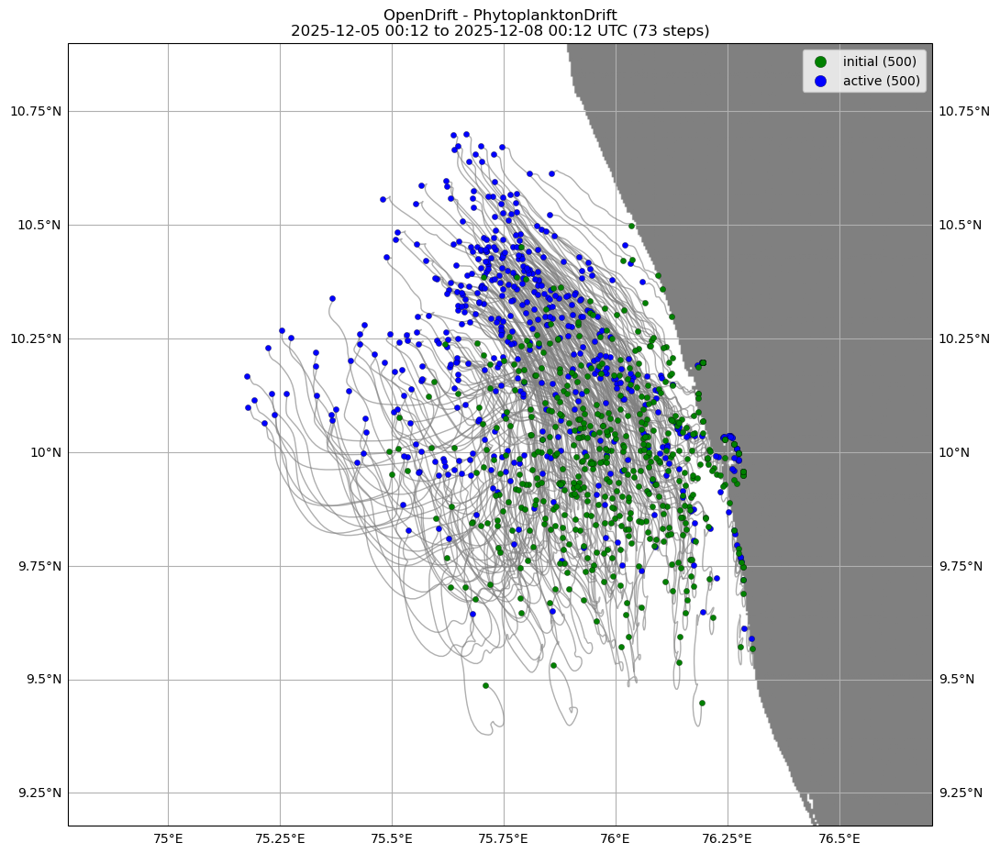

23:14:08 WARNING opendrift:2469: Plotting fast. This will make your plots less accurate.
23:14:09 INFO    opendrift:3107: Preparing animation for notebook....


23:15:03 INFO    opendrift:3080: Time to make animation: 0:00:54.769875
23:15:04 INFO    opendrift:3107: Preparing animation for notebook....


23:15:18 INFO    opendrift.models.oceandrift:643: Time to make animation: 0:00:15.099853


In [7]:
"""
Cod egg
=============
"""

from opendrift.readers import reader_netCDF_CF_generic
from opendrift.models.phyto import PhytoplanktonDrift
from datetime import datetime, timedelta

o = PhytoplanktonDrift(loglevel=20)  # Set loglevel to 0 for debug information

#Forcing with Topaz ocean model and MEPS atmospheric model
o.add_readers_from_list([
    'https://tds.hycom.org/thredds/dodsC/FMRC_ESPC-D-V02_uv3z/FMRC_ESPC-D-V02_uv3z_best.ncd',
    'https://pae-paha.pacioos.hawaii.edu/thredds/dodsC/ncep_global/NCEP_Global_Atmospheric_Model_best.ncd'])

#%%
# Adjusting some configuration
o.set_config('drift:vertical_mixing', True)
o.set_config('vertical_mixing:diffusivitymodel', 'windspeed_Sundby1983') # windspeed parameterization for eddy diffusivity
#%%
# Vertical mixing requires fast time step
o.set_config('vertical_mixing:timestep', 60.) # seconds

#%%
# spawn NEA cod eggs at defined position and time
time = datetime.now()
o.seed_elements(76 , 10, z=0, radius=20000, number=500,
                time=time, diameter=0.0014, density=1020)
#o.seed_elements(76, 9, z=0, radius=200, number=500,
 #               time=time, diameter=0.0014, density=1050)
# o.seed_elements(13.5, 68., z=0, radius=2000, number=500,
#                 time=time, diameter=0.0014, density=1050)
# o.seed_elements(13., 67.8, z=0, radius=2000, number=500,
#                 time=time, diameter=0.0014, density=1050)

# #%%
# Running model
model_run = o.run(duration=timedelta(hours=72), time_step=3600)

#%%
# Print and plot results.
# At the end the wind vanishes, and eggs come to surface
print(o)

o.plot(fast=True)
o.animation(fast=True, color='z')

#%%
# .. image:: /gallery/animations/example_codegg_0.gif

#%% Vertical distribution of particles
o.animate_vertical_distribution()

#%%
# .. image:: /gallery/animations/example_codegg_1.gif


00:26:54 WARNING py.warnings:230: /var/folders/mf/6gftk9cs5cj9wfw8h2d7_3hr0000gn/T/ipykernel_18609/3969944016.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cbar.ax.set_yticklabels([mdates.num2date(t).strftime('%Y-%m-%d\n%H:%M') for t in cbar_ticks])



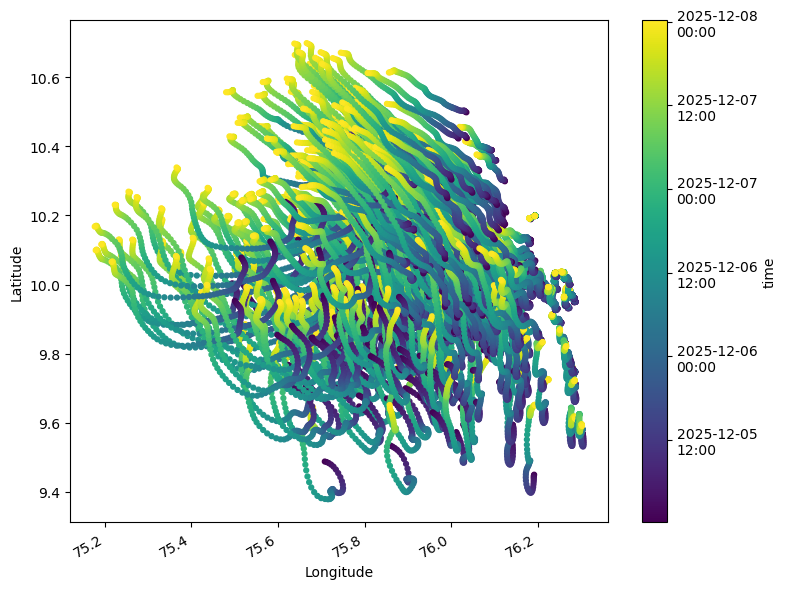

In [84]:
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Convert xarray Dataset to a DataFrame and bring the index levels (trajectory, time) into columns
testdata = model_run.to_dataframe().reset_index()

# Color the scatter by time: convert datetimes to matplotlib numeric values
time_nums = mdates.date2num(testdata['time'])

plt.figure(figsize=(8, 6))
sc = plt.scatter(testdata['lon'], testdata['lat'], c=time_nums, cmap='viridis', marker='o', s=12)
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Add a colorbar showing the time (formatted)
cbar = plt.colorbar(sc)
cbar.set_label('time')
cbar_ticks = cbar.get_ticks()
cbar.ax.set_yticklabels([mdates.num2date(t).strftime('%Y-%m-%d\n%H:%M') for t in cbar_ticks])

plt.gcf().autofmt_xdate()
plt.show()






In [85]:
# Import modules
import copernicusmarine

# Load dataframe
request_dataframe = copernicusmarine.read_dataframe(
    dataset_id = "cmems_mod_glo_bgc-nut_anfc_0.25deg_P1D-m",
    username = "mhussain4",
    password = "Supperdonkey77@",
    minimum_longitude = testdata['lon'].min(),
    maximum_longitude = testdata['lon'].max(),
    minimum_latitude = testdata['lat'].max(),
    maximum_latitude = testdata['lat'].max(),
   # variables = ["CHL"],
    start_datetime = testdata['time'].min().strftime('%Y-%m-%d'),
    end_datetime = testdata['time'].max().strftime('%Y-%m-%d')
)

# Load dataframe
request_kd = copernicusmarine.read_dataframe(
    dataset_id = "cmems_mod_glo_bgc-optics_anfc_0.25deg_P1D-m",
    username = "mhussain4",
    password = "Supperdonkey77@",
    minimum_longitude = testdata['lon'].min(),
    maximum_longitude = testdata['lon'].max(),
    minimum_latitude = testdata['lat'].max(),
    maximum_latitude = testdata['lat'].max(),
   # variables = ["CHL"],
    start_datetime = testdata['time'].min().strftime('%Y-%m-%d'),
    end_datetime = testdata['time'].max().strftime('%Y-%m-%d')
)

request_phyto= copernicusmarine.read_dataframe(
    dataset_id = "cmems_mod_glo_bgc-pft_anfc_0.25deg_P1D-m",
    username = "mhussain4",
    password = "Supperdonkey77@",
    minimum_longitude = testdata['lon'].min(),
    maximum_longitude = testdata['lon'].max(),
    minimum_latitude = testdata['lat'].max(),
    maximum_latitude = testdata['lat'].max(),
   # variables = ["CHL"],
    start_datetime = testdata['time'].min().strftime('%Y-%m-%d'),
    end_datetime = testdata['time'].max().strftime('%Y-%m-%d')
)





INFO - 2025-12-05T00:26:59Z - Selected dataset version: "202311"
00:26:59 INFO    copernicusmarine:251: Selected dataset version: "202311"
INFO - 2025-12-05T00:26:59Z - Selected dataset part: "default"
00:26:59 INFO    copernicusmarine:271: Selected dataset part: "default"
INFO - 2025-12-05T00:27:28Z - Selected dataset version: "202311"
00:27:28 INFO    copernicusmarine:251: Selected dataset version: "202311"
INFO - 2025-12-05T00:27:28Z - Selected dataset part: "default"
00:27:28 INFO    copernicusmarine:271: Selected dataset part: "default"
INFO - 2025-12-05T00:27:41Z - Selected dataset version: "202311"
00:27:41 INFO    copernicusmarine:251: Selected dataset version: "202311"
INFO - 2025-12-05T00:27:41Z - Selected dataset part: "default"
00:27:41 INFO    copernicusmarine:271: Selected dataset part: "default"


In [86]:
nutrients =  request_dataframe.reset_index()
kd = request_kd.reset_index()
phyto = request_phyto.reset_index()

phyto_nutri = pd.merge(nutrients,kd).merge(phyto)

In [87]:

import numpy as np
from scipy.spatial import cKDTree

# Build KDTree on df2 coordinates
tree = cKDTree(testdata[["lat", "lon"]].values)

# Query nearest neighbor for df1 points
dist, idx = tree.query(phyto_nutri[["latitude", "longitude"]].values)
# # Add results to df1
# phyto_nutri["fe"] = phyto_nutri["fe"].iloc[idx].values
# testdata["no3"] = phyto_nutri["no3"].iloc[idx].values
# testdata["po4"] = phyto_nutri["po4"].iloc[idx].values
# testdata["si"] = phyto_nutri["si"].iloc[idx].values
# testdata["kd"] = phyto_nutri["kd"].iloc[idx].values
# testdata["chl"] = phyto_nutri["chl"].iloc[idx].values


# testdata["distance"] = dist
# testdata=testdata.dropna()

In [88]:
phyto_nutri['latitude'].shape
testdata['lat'].shape

(36500,)

In [89]:
# Index objects are immutable; make a mutable list, modify and reassign
cols = list(phyto_nutri.columns)
cols[1] = "lat"
cols[2] = "lon"
phyto_nutri.columns = cols

In [ ]:
# testdata.to_csv("first_data.csv")
# firstdata = pd.read_csv("first_data.csv")
# firstdata['lon'].values

array([75.53435 , 75.53029 , 75.527176, ..., 75.3148  , 75.309456,
       75.303764], shape=(1061,))

In [90]:
model_data = model_run.to_dataframe()

In [91]:
model_data.columns

Index(['status', 'moving', 'age_seconds', 'origin_marker', 'lon', 'lat', 'z',
       'wind_drift_factor', 'current_drift_factor', 'terminal_velocity',
       'diameter', 'density', 'dead', 'x_sea_water_velocity',
       'y_sea_water_velocity', 'sea_surface_height',
       'sea_surface_wave_significant_height', 'sea_ice_area_fraction',
       'x_wind', 'y_wind', 'land_binary_mask',
       'sea_floor_depth_below_sea_level', 'ocean_vertical_diffusivity',
       'ocean_mixed_layer_thickness', 'sea_water_temperature',
       'sea_water_salinity', 'surface_downward_x_stress',
       'surface_downward_y_stress', 'turbulent_kinetic_energy',
       'turbulent_generic_length_scale', 'upward_sea_water_velocity'],
      dtype='object')

In [94]:
# Reset model_data index so we have a flat dataframe to join to
md = model_data.reset_index()  # keeps 'trajectory' and 'time' as columns

# Coordinates arrays: (n_points, 2) with order [lat, lon]
coords1 = md[['lat', 'lon']].to_numpy()
coords2 = phyto_nutri[['lat', 'lon']].to_numpy()

# Build KDTree on phyto_nutri coords
tree = cKDTree(coords2)

# Query k nearest neighbors
k = 3
distances, indices = tree.query(coords1, k=k)  # shapes: (n_points, k)

# Build nearest-neighbor DataFrame (wide-form)
nearest_df = pd.DataFrame()

for i in range(k):
    nearest_df[f'nearest_index_{i+1}'] = indices[:, i]
    nearest_df[f'distance_{i+1}'] = distances[:, i]
    nearest_df[f'nearest_depth_{i+1}'] = phyto_nutri['depth'].values[indices[:, i]]
    nearest_df[f'nearest_lat_{i+1}'] = phyto_nutri['lat'].values[indices[:, i]]
    nearest_df[f'nearest_lon_{i+1}'] = phyto_nutri['lon'].values[indices[:, i]]
    nearest_df[f'fe_nn_{i+1}'] = phyto_nutri['fe'].values[indices[:, i]]
    nearest_df[f'no3_nn_{i+1}'] = phyto_nutri['no3'].values[indices[:, i]]
    nearest_df[f'po4_nn_{i+1}'] = phyto_nutri['po4'].values[indices[:, i]]
    nearest_df[f'si_nn_{i+1}'] = phyto_nutri['si'].values[indices[:, i]]
    nearest_df[f'kd_nn_{i+1}'] = phyto_nutri['kd'].values[indices[:, i]]
    nearest_df[f'chl_nn_{i+1}'] = phyto_nutri['chl'].values[indices[:, i]]
    nearest_df[f'phyc_nn_{i+1}'] = phyto_nutri['phyc'].values[indices[:, i]]

# Concatenate with the model dataframe side-by-side
result = pd.concat([md.reset_index(drop=True), nearest_df.reset_index(drop=True)], axis=1)

# Quick check
print(result.head())


   trajectory                       time  status  moving  age_seconds  \
0           0 2025-12-05 00:12:51.572834     0.0     1.0          0.0   
1           0 2025-12-05 01:12:51.572834     0.0     1.0       3600.0   
2           0 2025-12-05 02:12:51.572834     0.0     1.0       7200.0   
3           0 2025-12-05 03:12:51.572834     0.0     1.0      10800.0   
4           0 2025-12-05 04:12:51.572834     0.0     1.0      14400.0   

   origin_marker        lon        lat         z  wind_drift_factor  ...  \
0            0.0  76.264420  10.019151  0.000000               0.02  ...   
1            0.0  76.263329  10.019363 -0.608627               0.02  ...   
2            0.0  76.262909  10.019398 -2.433307               0.02  ...   
3            0.0  76.263184  10.019285  0.000000               0.02  ...   
4            0.0  76.263939  10.018892 -0.447513               0.02  ...   

   nearest_depth_3  nearest_lat_3  nearest_lon_3  fe_nn_3  no3_nn_3  po4_nn_3  \
0      1941.893433     

In [95]:
# Ensure we have a datetime index named 'time' for time-based interpolation.
# Handle both cases where 'time' is a column or already the index.
if 'time' in result.columns:
	result['time'] = pd.to_datetime(result['time'])
	result = result.set_index('time')
else:
	# If index name is 'time' or index is already a DatetimeIndex, ensure it's datetime
	if result.index.name == 'time' or isinstance(result.index, pd.DatetimeIndex):
		result.index = pd.to_datetime(result.index)
	else:
		# Try to coerce the index to datetime (works if index values are datetime-like)
		try:
			result.index = pd.to_datetime(result.index)
		except Exception:
			raise KeyError("No 'time' column or datetime-like index found in 'result'")

# Now interpolate along the time index and drop any remaining NaNs
result_interpolated = result.interpolate(method='time', limit_direction='both')
result_clean = result_interpolated.dropna()
result_clean

,trajectory,status,moving,age_seconds,origin_marker,lon,lat,z,wind_drift_factor,current_drift_factor,...,nearest_depth_3,nearest_lat_3,nearest_lon_3,fe_nn_3,no3_nn_3,po4_nn_3,si_nn_3,kd_nn_3,chl_nn_3,phyc_nn_3
time,,,,,,,,,,,,,,,,,,,,,
2025-12-05 00:12:51.572834,0,0.0,1.0,0.0,0.0,76.264420,10.019151,0.000000,0.02,1.0,...,1941.893433,10.75,76.25,0.001435,0.170218,0.257183,1.024012,0.131820,1.318725,5.510093
2025-12-05 01:12:51.572834,0,0.0,1.0,3600.0,0.0,76.263329,10.019363,-0.608627,0.02,1.0,...,1941.893433,10.75,76.25,0.002671,0.324548,0.268763,1.231079,0.146806,1.585044,6.203692
2025-12-05 02:12:51.572834,0,0.0,1.0,7200.0,0.0,76.262909,10.019398,-2.433307,0.02,1.0,...,1941.893433,10.75,76.25,0.002671,0.324548,0.268763,1.231079,0.146806,1.585044,6.203692
2025-12-05 03:12:51.572834,0,0.0,1.0,10800.0,0.0,76.263184,10.019285,0.000000,0.02,1.0,...,1941.893433,10.75,76.25,0.002678,0.282287,0.264627,1.193111,0.150630,1.650337,6.476684
2025-12-05 04:12:51.572834,0,0.0,1.0,14400.0,0.0,76.263939,10.018892,-0.447513,0.02,1.0,...,1941.893433,10.75,76.25,0.002678,0.282287,0.264627,1.193111,0.150630,1.650337,6.476684
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-12-07 20:12:51.572834,499,0.0,1.0,244800.0,0.0,75.757591,10.362628,-1.138050,0.02,1.0,...,9.572997,10.75,75.75,0.002678,0.282287,0.264627,1.193111,0.150630,1.650337,6.476684
2025-12-07 21:12:51.572834,499,0.0,1.0,248400.0,0.0,75.751289,10.367819,0.000000,0.02,1.0,...,9.572997,10.75,75.75,0.002678,0.282287,0.264627,1.193111,0.150630,1.650337,6.476684
2025-12-07 22:12:51.572834,499,0.0,1.0,252000.0,0.0,75.743896,10.372247,-0.865591,0.02,1.0,...,9.572997,10.75,75.75,0.002671,0.324548,0.268763,1.231079,0.146806,1.585044,6.203692


In [ ]:
# # Use already-imported objects in earlier cells (pd, cKDTree, etc.)
# # Reset model_data index so we have a flat dataframe to join to
# md = model_data.reset_index()  # keeps 'trajectory' and 'time' as columns

# # Coordinates arrays: (n_points, 2) with order [lat, lon]
# coords1 = md[['lat', 'lon']].to_numpy()
# coords2 = phyto_nutri[['lat', 'lon']].to_numpy()

# # Build KDTree on phyto_nutri coords
# tree = cKDTree(coords2)

# # Query nearest neighbor for every point in coords1 (vectorized)
# distances, indices = tree.query(coords1, k=3)

# # Build nearest-neighbor DataFrame using values indexed by 'indices'
# nearest_df = pd.DataFrame({
#     'nearest_index': indices,
#     'distance': distances,
#     'nearest_depth': phyto_nutri['depth'].values[indices],
#     'nearest_lat': phyto_nutri['lat'].values[indices],
#     'nearest_lon': phyto_nutri['lon'].values[indices],
#     # copy any other variables you want from phyto_nutri (they will align by nearest neighbor)
#     'fe_nn': phyto_nutri['fe'].values[indices],
#     'no3_nn': phyto_nutri['no3'].values[indices],
#     'po4_nn': phyto_nutri['po4'].values[indices],
#     'si_nn': phyto_nutri['si'].values[indices],
#     'kd_nn': phyto_nutri['kd'].values[indices],
#     'chl_nn': phyto_nutri['chl'].values[indices],
#     'phyc_nn': phyto_nutri['phyc'].values[indices],
# })

# # Concatenate with the model dataframe (md) side-by-side
# result = pd.concat([md.reset_index(drop=True), nearest_df.reset_index(drop=True)], axis=1)

# # Show a quick check
# print(result.head())


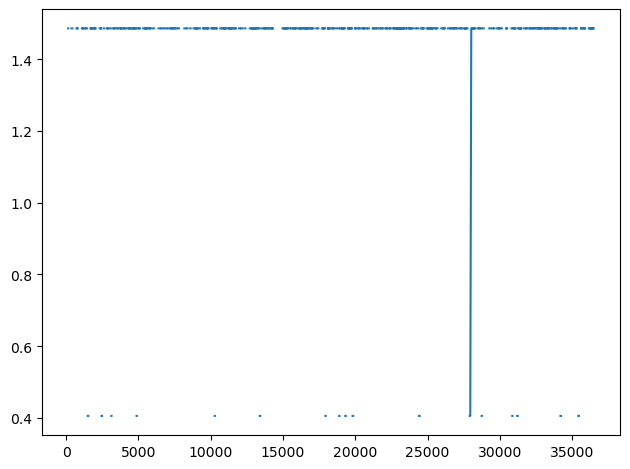

In [98]:
result_clean['fe_nn_1']

time
2025-12-05 00:12:51.572834    0.002671
2025-12-05 01:12:51.572834    0.002671
2025-12-05 02:12:51.572834    0.002671
2025-12-05 03:12:51.572834    0.002671
2025-12-05 04:12:51.572834    0.002671
                                ...   
2025-12-07 20:12:51.572834    0.002671
2025-12-07 21:12:51.572834    0.002671
2025-12-07 22:12:51.572834    0.002678
2025-12-07 23:12:51.572834    0.002678
2025-12-08 00:12:51.572834    0.002678
Name: fe_nn_1, Length: 36500, dtype: float32

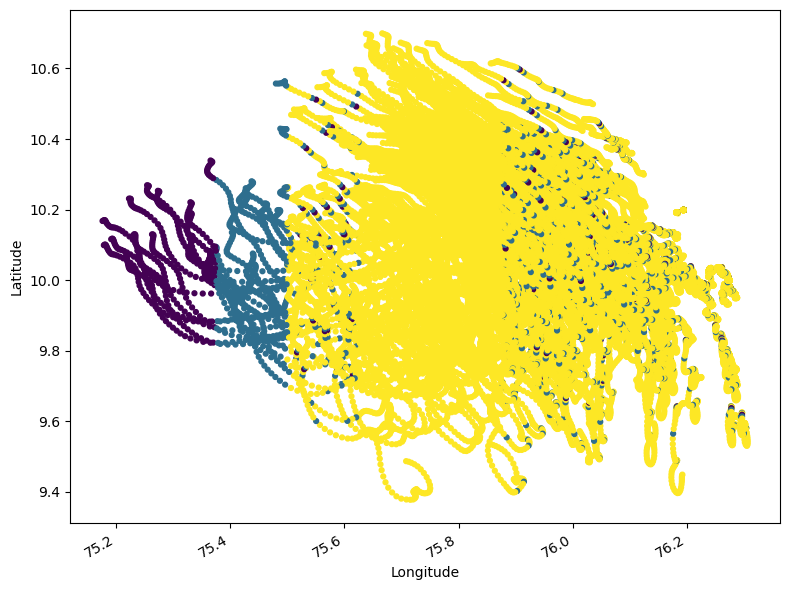

In [103]:
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Convert xarray Dataset to a DataFrame and bring the index levels (trajectory, time) into columns
#testdata = model_run.to_dataframe().reset_index()

# Color the scatter by time: convert datetimes to matplotlib numeric values
#time_nums = mdates.date2num(result_clean['time'])

plt.figure(figsize=(8, 6))
sc = plt.scatter(result_clean['lon'], result_clean['lat'], c=result_clean['fe_nn_1'], cmap='viridis', marker='o', s=12)
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Add a colorbar showing the time (formatted)
# cbar = plt.colorbar(sc)
# cbar.set_label('time')
# cbar_ticks = cbar.get_ticks()
# cbar.ax.set_yticklabels([mdates.num2date(t).strftime('%Y-%m-%d\n%H:%M') for t in cbar_ticks])

plt.gcf().autofmt_xdate()
plt.show()




